# Project 2：NASA Data Acquisation, Visualization, and Analysis

In [1]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the NASA API and Data Collection

- Register for a NASA API key and understand the different types of data that the API provides.
- Run the Python script below to fetch data about **Near Earth Objects (NEOs)** from the NASA API for a years data.
- Extract and understand the different pieces of data provided for each NEO.

In [2]:
import requests
import time
from datetime import datetime, timedelta
from getpass import getpass

# Set your NASA API KEY, this step asks you to enter your API KEY.
# (The input box may be float in the top on your editor.)
api_key = getpass()

········


In [3]:
# Set the start and end dates for the data you want to fetch
start_date = datetime.strptime('2022-01-01', '%Y-%m-%d')
end_date = start_date + timedelta(days=365)  # 1 year later

# Initialize a list to store the data
data = []

# Fetch data from the NASA API 7 days at a time
# The introduction of the API is on https://api.nasa.gov, under "Browse APIs" -> "Asteroids NeoWs"
# You can look into the example query in the link below to see what the data look like:
# https://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-07&end_date=2015-09-08&api_key=DEMO_KEY
current_date = start_date
while current_date < end_date:
    print(current_date)
    next_date = min(current_date + timedelta(days=7), end_date)
    response = requests.get(f'https://api.nasa.gov/neo/rest/v1/feed?start_date={current_date.strftime("%Y-%m-%d")}&end_date={next_date.strftime("%Y-%m-%d")}&api_key={api_key}')
    data.append(response.json())
    current_date = next_date
    time.sleep(1)  # To avoid hitting the rate limit

# Now 'data' contains the NEO data for the 1-year period


2022-01-01 00:00:00
2022-01-08 00:00:00
2022-01-15 00:00:00
2022-01-22 00:00:00
2022-01-29 00:00:00
2022-02-05 00:00:00
2022-02-12 00:00:00
2022-02-19 00:00:00
2022-02-26 00:00:00
2022-03-05 00:00:00
2022-03-12 00:00:00
2022-03-19 00:00:00
2022-03-26 00:00:00
2022-04-02 00:00:00
2022-04-09 00:00:00
2022-04-16 00:00:00
2022-04-23 00:00:00
2022-04-30 00:00:00
2022-05-07 00:00:00
2022-05-14 00:00:00
2022-05-21 00:00:00
2022-05-28 00:00:00
2022-06-04 00:00:00
2022-06-11 00:00:00
2022-06-18 00:00:00
2022-06-25 00:00:00
2022-07-02 00:00:00
2022-07-09 00:00:00
2022-07-16 00:00:00
2022-07-23 00:00:00
2022-07-30 00:00:00
2022-08-06 00:00:00
2022-08-13 00:00:00
2022-08-20 00:00:00
2022-08-27 00:00:00
2022-09-03 00:00:00
2022-09-10 00:00:00
2022-09-17 00:00:00
2022-09-24 00:00:00
2022-10-01 00:00:00
2022-10-08 00:00:00
2022-10-15 00:00:00
2022-10-22 00:00:00
2022-10-29 00:00:00
2022-11-05 00:00:00
2022-11-12 00:00:00
2022-11-19 00:00:00
2022-11-26 00:00:00
2022-12-03 00:00:00
2022-12-10 00:00:00


In [4]:
data

[{'links': {'next': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-01-08&end_date=2022-01-15&detailed=false&api_key=e7Q0CxzcyefKwhZg30gwiafcoCSXmd09bVhDIEr1',
   'previous': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2021-12-25&end_date=2022-01-01&detailed=false&api_key=e7Q0CxzcyefKwhZg30gwiafcoCSXmd09bVhDIEr1',
   'self': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-01-01&end_date=2022-01-08&detailed=false&api_key=e7Q0CxzcyefKwhZg30gwiafcoCSXmd09bVhDIEr1'},
  'element_count': 125,
  'near_earth_objects': {'2022-01-07': [{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2216523?api_key=e7Q0CxzcyefKwhZg30gwiafcoCSXmd09bVhDIEr1'},
     'id': '2216523',
     'neo_reference_id': '2216523',
     'name': '216523 (2001 HY7)',
     'nasa_jpl_url': 'http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2216523',
     'absolute_magnitude_h': 20.7,
     'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.1925550782,
       'estimated_diameter_max': 0.4305662442},
      '

In [5]:
# Check the date coverage of your data.
dates_contained_in_data = []
for d in data:
    dates_contained_in_data += list(d['near_earth_objects'].keys())

print(sorted(dates_contained_in_data))

['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-08', '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-15', '2022-01-16', '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20', '2022-01-21', '2022-01-22', '2022-01-22', '2022-01-23', '2022-01-24', '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28', '2022-01-29', '2022-01-29', '2022-01-30', '2022-01-31', '2022-02-01', '2022-02-02', '2022-02-03', '2022-02-04', '2022-02-05', '2022-02-05', '2022-02-06', '2022-02-07', '2022-02-08', '2022-02-09', '2022-02-10', '2022-02-11', '2022-02-12', '2022-02-12', '2022-02-13', '2022-02-14', '2022-02-15', '2022-02-16', '2022-02-17', '2022-02-18', '2022-02-19', '2022-02-19', '2022-02-20', '2022-02-21', '2022-02-22', '2022-02-23', '2022-02-24', '2022-02-25', '2022-02-26', '2022-02-26', '2022-02-27', '2022-02-28', '2022-03-01', '2022-03-02', '2022-03-03', '2022-03-04', '2022

In [6]:
from src.utils import get_a_random_chunk_property

In [7]:
get_a_random_chunk_property(data)

date: 2022-03-12
NEO name: (2022 DW3)
id: 54248635


For the remaining tasks, you have to organize the data as pd.DataFrame so as to suit the specific need in each task. This part may require a considerably amount of efforts, which is normal in data science and analytics works.

# Task 2: Data Analysis

- Calculate the average size of the NEOs for each day.
- Determine the proportion of NEOs that are potentially hazardous.
- Find the NEO with the closest approach distance for each day.
- Use statistical methods to analyze the data. For example, calculate the mean, median, mode, and standard deviation of the NEO sizes. Determine if the size of a NEO is correlated with whether it is potentially hazardous.

In [7]:
import pandas as pd

# Initialize a list to store data. 
NEO_data = {}
for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        if date in NEO_data:
            NEO_data[date]['NEO_objects'] += len(objects)
            total_size = NEO_data[date]['average_size'] * NEO_data[date]['NEO_objects']
            NEO_data[date]['average_size'] = (total_size + sum(obj['estimated_diameter']['kilometers']['estimated_diameter_max'] for obj in objects)) / NEO_data[date]['NEO_objects']
        else:
            NEO_data[date] = {'NEO_objects': len(objects), 'average_size': sum(obj['estimated_diameter']['kilometers']['estimated_diameter_max'] for obj in objects) / len(objects)}
        
# Customizing dataframe according to the task.
df = pd.DataFrame(NEO_data.items(), columns=['Date', 'Data'])
df = pd.concat([df.drop(['Data'], axis=1), df['Data'].apply(pd.Series)], axis=1)
df = df.rename(columns={'average_size': 'average_size'})

# Sorting data by date
df = df.sort_values('Date')

print(df)


           Date  NEO_objects  average_size
6    2022-01-01         23.0      0.226738
7    2022-01-02         13.0      0.156554
2    2022-01-03         14.0      0.038942
3    2022-01-04          9.0      0.110805
4    2022-01-05         15.0      0.244814
..          ...          ...           ...
358  2022-12-28         16.0      0.173399
362  2022-12-29         18.0      0.261076
364  2022-12-30          7.0      0.189996
363  2022-12-31         32.0      0.108397
365  2023-01-01         23.0      0.421630

[366 rows x 3 columns]


In [8]:
# Same approach. 
NEO_data = {}
for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        if date in NEO_data:
            NEO_data[date]['NEO_objects'] += len(objects)
            for obj in objects:
                if obj['is_potentially_hazardous_asteroid']:
                    NEO_data[date]['danger'] += 1
                else:
                    NEO_data[date]['not_danger'] += 1
        else:
            NEO_data[date] = {'NEO_objects': len(objects), 'danger': 0, 'not_danger': 0}
            for obj in objects:
                if obj['is_potentially_hazardous_asteroid']:
                    NEO_data[date]['danger'] += 1
                else:
                    NEO_data[date]['not_danger'] += 1

df_1 = pd.DataFrame(NEO_data.items(), columns=['Date', 'Data'])
df_1 = pd.concat([df_1.drop(['Data'], axis=1), df_1['Data'].apply(pd.Series)], axis=1)
df_1 = df_1.sort_values('Date')

print(df_1)


           Date  NEO_objects  danger  not_danger
6    2022-01-01           23       3          20
7    2022-01-02           13       0          13
2    2022-01-03           14       0          14
3    2022-01-04            9       1           8
4    2022-01-05           15       2          13
..          ...          ...     ...         ...
358  2022-12-28           16       0          16
362  2022-12-29           18       0          18
364  2022-12-30            7       0           7
363  2022-12-31           32       2          30
365  2023-01-01           23       2          21

[366 rows x 4 columns]


In [9]:
Total_NEOs=int(df_1['NEO_objects'].sum())
Total_NEOs

7951

In [10]:
Number_of_dangerous_NEOs=df_1['danger'].sum()
Number_of_dangerous_NEOs

507

In [11]:
# Calculate the proporsion 
Proportion = Number_of_dangerous_NEOs / Total_NEOs * 100

print("Propotion of dangerous NEOs: {:.2f}%".format(Proportion))


Propotion of dangerous NEOs: 6.38%


In [12]:

closest_approach_data = []
for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        if len(objects) > 0:
            closest_neo = min(objects, key=lambda x: x['close_approach_data'][0]['miss_distance']['kilometers'])
            closest_approach_data.append({
                'Date': date,
                'Closest_NEO': closest_neo['name'],
                'Closest_Dist': closest_neo['close_approach_data'][0]['miss_distance']['kilometers']
            })

df_2 = pd.DataFrame(closest_approach_data)

df_2 = df_2.sort_values('Date')

# Delete all duplications
print(df_2.drop_duplicates())


           Date  Closest_NEO        Closest_Dist
6    2022-01-01   (2022 AF2)  12431720.253045725
7    2022-01-02   (2022 AP1)    180597.061908216
2    2022-01-03   (2022 AZ2)   1966661.216022021
3    2022-01-04    (2023 AW)  17810689.136848906
4    2022-01-05  (2022 AV13)    109480.269041248
..          ...          ...                 ...
408  2022-12-28   (2022 YR5)  11149031.359469066
412  2022-12-29  (2019 AX11)  14847087.833589962
414  2022-12-30   (2022 YT5)  14634378.736178387
413  2022-12-31    (1995 CR)  11290876.873368435
416  2023-01-01   (2021 AP1)  10795251.111612603

[366 rows x 3 columns]


In [13]:
# This code wil find the NEO closest to the earth and provide us with identification information on the specific NEO
min_dist_row = df_2[df_2['Closest_Dist'] == df_2['Closest_Dist'].min()]

print(min_dist_row)

           Date Closest_NEO       Closest_Dist
375  2022-11-21  (2019 VA4)  10009335.72456999


In [14]:
import statistics

sizes = []
for d in data:
    near_earth_objects = d['near_earth_objects']
    for _, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            sizes.append(size)

mean_size = sum(sizes) / len(sizes)
mode_size = statistics.mode(sizes)
median_size = statistics.median(sizes)
std_dev = statistics.stdev(sizes)

print("Mean NEO size:", mean_size)
print("Mode NEO size:", mode_size)
print("Median NEO size:", median_size)
print("Standard Deviation of NEO sizes:", std_dev)



Mean NEO size: 0.20791612723515232
Mode NEO size: 0.0472106499
Median NEO size: 0.0765667087
Standard Deviation of NEO sizes: 0.40826165962273214


The statistical analysis of the NEO sizes reveals that the mean size is approximately 0.21 kilometers with a standard deviation of 0.41, while the mode and median sizes are 0.05 and 0.08 kilometers, respectively.

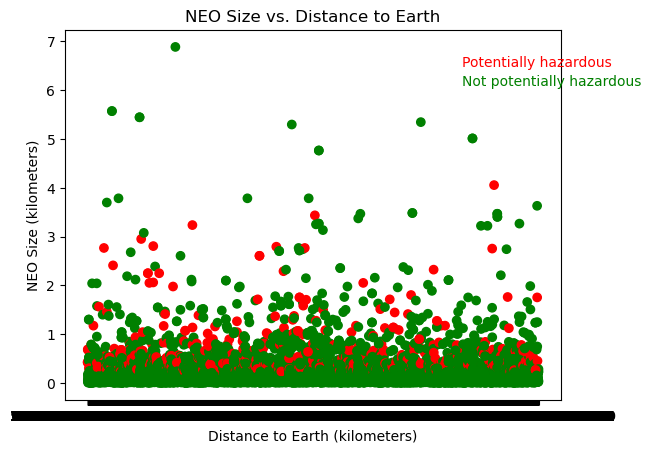

In [15]:
import matplotlib.pyplot as plt

sizes = []
distances = []
colors = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for _, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            distance = obj['close_approach_data'][0]['miss_distance']['kilometers']
            sizes.append(size)
            distances.append(distance)
            if obj['is_potentially_hazardous_asteroid']:
                colors.append('red')
            else:
                colors.append('green')
              
plt.scatter(distances, sizes, c=colors)
plt.xlabel('Distance to Earth (kilometers)')
plt.ylabel('NEO Size (kilometers)')
plt.title('NEO Size vs. Distance to Earth')

# Adding matching colours to text
plt.text(0.8, 0.9, 'Potentially hazardous', color='red', transform=plt.gca().transAxes)
plt.text(0.8, 0.85, 'Not potentially hazardous', color='green', transform=plt.gca().transAxes)

plt.show()

The scatter plot does not provide any additional useful information. It confirms our prior knowledge that the majority of the observed NEOs are relatively small, with only a small proportion being outliers. When working with such large data observations, the scatter plot does not offer a deeper understanding. Therefore, we need to employ grouping techniques to investigate potential relationships.

In order to examine potential relationships between the size of NEOs and their hazardous nature, we have grouped the observations based on whether they are potentially hazardous or not, and calculated the average size. This approach allows us to draw conclusions regarding the potential association between these variables.

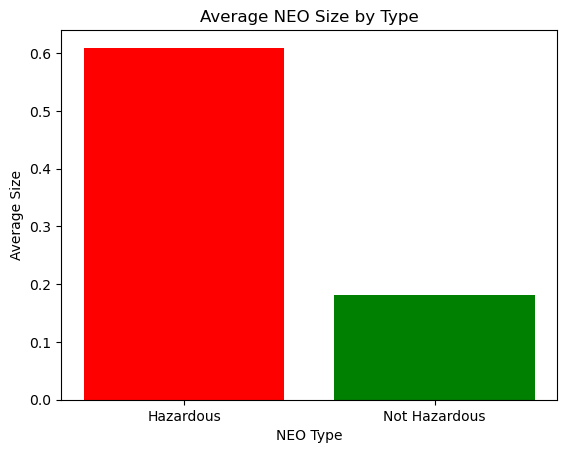

In [18]:
# Creating two lists
hazardous_neos = []
not_hazardous_neos = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for _, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            if obj['is_potentially_hazardous_asteroid']:
                hazardous_neos.append(size)
            else:
                not_hazardous_neos.append(size)

# Calculate mean sizes
hazardous_mean_size = sum(hazardous_neos) / len(hazardous_neos)
not_hazardous_mean_size = sum(not_hazardous_neos) / len(not_hazardous_neos)

# creating a DataFrame to visualization 
df = pd.DataFrame({'NEO Type': ['Hazardous', 'Not Hazardous'],
                   'Average Size': [hazardous_mean_size, not_hazardous_mean_size]})

# Define colours
colors = ['red', 'green']

# Annoys bar chart
plt.bar(df['NEO Type'], df['Average Size'], color=colors)
plt.xlabel('NEO Type')
plt.ylabel('Average Size')
plt.title('Average NEO Size by Type')

plt.show()


The histogram reveals a clear relationship between the size of NEOs and their potential hazard.

The sub-conclusion for Task 2 is that the average size of the observed NEOs in 2022 is 0.21 km, while the median is less than half, namely 0.08 km. This provides insights that the majority of NEOs are smaller than the average, and it is a smaller number of NEOs that contribute to raising the average. The final diagram provided information that the average size of potentially hazardous NEOs was significantly larger than the average size of non-hazardous NEOs. However, we cannot conclude that it is the large NEOs that are potentially hazardous, as the scatter plot showed that the largest NEOs were not potentially hazardous. Nevertheless, we can conclude that, on average, they are larger.

### Task 3: Data Visualization Part A

- Create a line plot of the number of NEOs per week.
- Create a histogram of the distribution of NEO sizes.
- Create a bar plot of the average NEO size per week.
- Use a library like Seaborn to create more complex visualizations, such as a box plot of the NEO sizes or a heat map of the number of NEOs per week. **Be creative**!

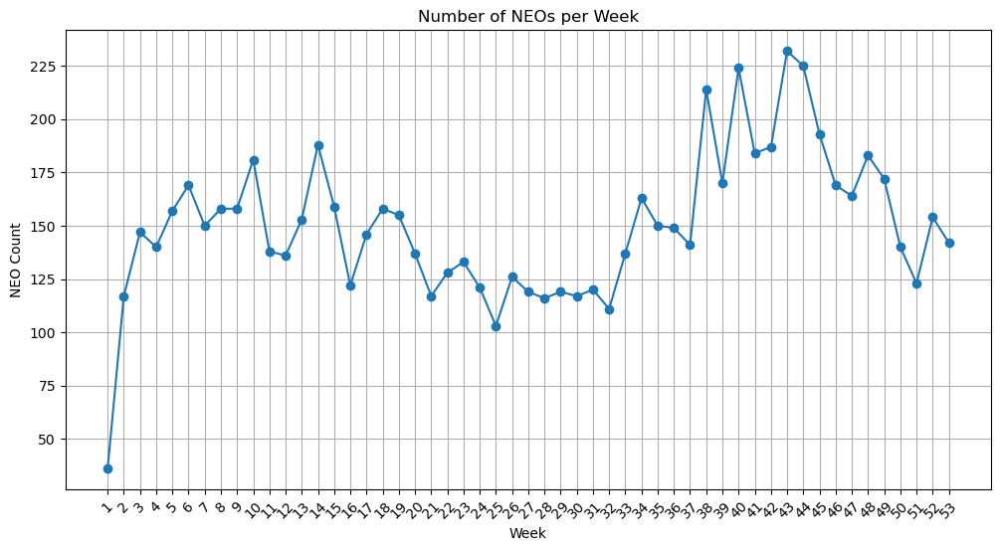

In [25]:
weekly_neo_counts = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        week_start_date = pd.to_datetime(date).to_period('W').start_time
        week_end_date = pd.to_datetime(date).to_period('W').end_time
        neo_count = len(objects)
        weekly_neo_counts.append({'Week Start': week_start_date, 'Week End': week_end_date, 'NEO Count': neo_count})

df = pd.DataFrame(weekly_neo_counts)
df = df.groupby(['Week Start', 'Week End']).sum().reset_index()

week_numbers = range(1, len(df) + 1)  # Weeknumbers as x-values

plt.figure(figsize=(12, 6))
plt.plot(week_numbers, df['NEO Count'], marker='o')
plt.xlabel('Week')
plt.ylabel('NEO Count')
plt.title('Number of NEOs per Week')
plt.xticks(week_numbers, week_numbers, rotation=45)  # Use weeknumbers as tick labels
plt.grid(True)
plt.show()
#This code first creates a list weekly_neos where each record contains the start date and end date of a week and the number of NEOs for that week. 
#Then the list is converted to a pandas DataFrame where we group by week and sum the number of NEOs for each week.

#Finally, a line chart is created using the Matplotlib library showing the number of NEOs per week. 
#The X-axis represents the weeks and the Y-axis represents the number of NEOs. The graph is provided with axis titles and grid lines for better readability.


As shown on the diagram, that is divided by week that the most number og NEOs is between week 38 and 45 respectively. We can also conclude that between week 21 and 32 we have the lowest amount of NEOs.

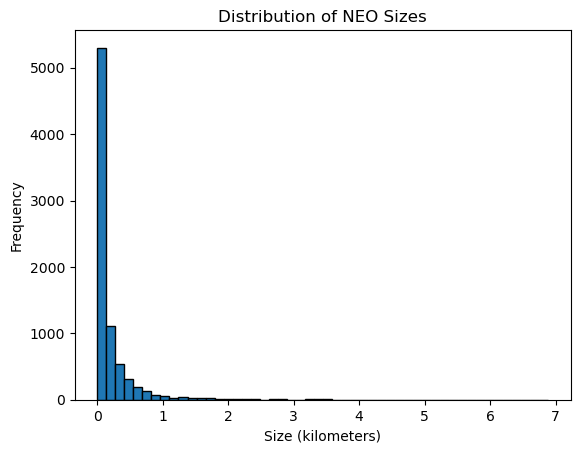

In [29]:
# Import the NEO-sizes from the data
neo_sizes = []
for d in data:
    near_earth_objects = d['near_earth_objects']
    for _, objects in near_earth_objects.items():
        for obj in objects:
            neo_sizes.append(obj['estimated_diameter']['kilometers']['estimated_diameter_max'])

# Create histogram
plt.hist(neo_sizes, bins=50, edgecolor='black')

# Customize the diagram
plt.title('Distribution of NEO Sizes')
plt.xlabel('Size (kilometers)')
plt.ylabel('Frequency')

# Show the plottet diagram
plt.show()

As the histograms shows a large amount of the NEOs is close to 0 km. Only a handfull of the NEOs is largere than 2 km. 

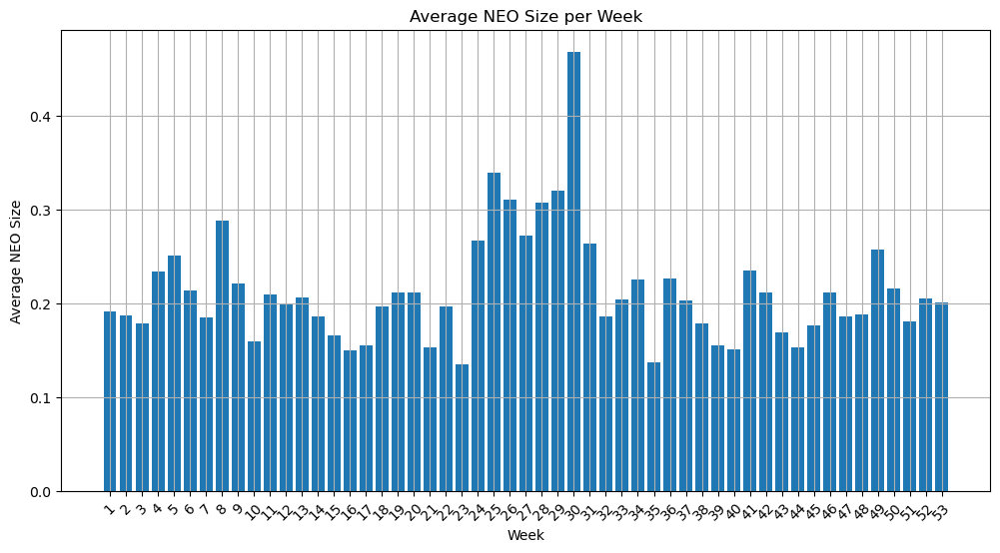

In [30]:
weekly_avg_sizes = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        week_start_date = pd.to_datetime(date).to_period('W').start_time
        week_end_date = pd.to_datetime(date).to_period('W').end_time
        avg_size = sum(obj['estimated_diameter']['kilometers']['estimated_diameter_max'] for obj in objects) / len(objects)
        weekly_avg_sizes.append({'Week Start': week_start_date, 'Week End': week_end_date, 'Average NEO Size': avg_size})

df = pd.DataFrame(weekly_avg_sizes)
df = df.groupby(['Week Start', 'Week End']).mean().reset_index()

week_numbers = range(1, len(df) + 1)  # Weeknumbers as x-values

plt.figure(figsize=(12, 6))
plt.bar(week_numbers, df['Average NEO Size'])
plt.xlabel('Week')
plt.ylabel('Average NEO Size')
plt.title('Average NEO Size per Week')
plt.xticks(week_numbers, week_numbers, rotation=45)  # Use weeknumbers as tick labels
plt.grid(True)
plt.show()

This bar chart shows that the NEOs is larges between week 24 and 31. Which gives sence if we compare it with the diagram above. This period is also the period where there is the least amount og NEOs.

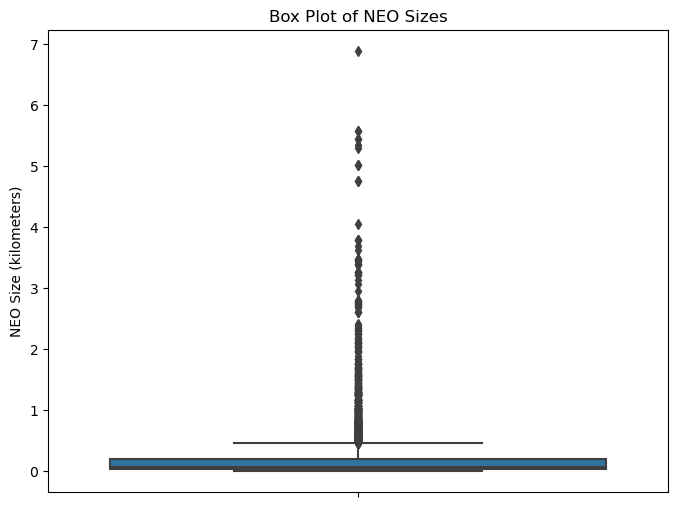

In [31]:
# We decided to use a boxplot to visualise the data
# The reason for this is that A boxplot allows you to visualize the distribution of NEO sizes
# Including the median, quartiles, and any outliers. 
# It can help identify trends and extreme values in the data
import seaborn as sns

neo_sizes = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        neo_sizes.extend([obj['estimated_diameter']['kilometers']['estimated_diameter_max'] for obj in objects])

df = pd.DataFrame(neo_sizes, columns=['NEO Size'])

plt.figure(figsize=(8, 6))
sns.boxplot(data=df, y='NEO Size')
plt.ylabel('NEO Size (kilometers)')
plt.title('Box Plot of NEO Sizes')
plt.show()

This boxplot shows the quartiles and we are able to see that there is a large amount of outliers.

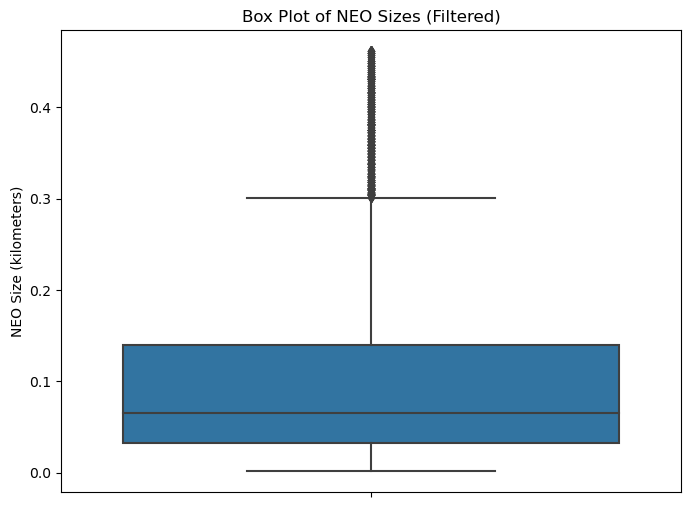

In [32]:
# The boxplot above is a lot of outliers and thats why we decided to change some of the data
# This makes the data more comprehensible
import numpy as np

neo_sizes = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        neo_sizes.extend([obj['estimated_diameter']['kilometers']['estimated_diameter_max'] for obj in objects])

df = pd.DataFrame(neo_sizes, columns=['NEO Size'])

# Calculate the boundaries for "fence"
q1 = np.percentile(df['NEO Size'], 25)
q3 = np.percentile(df['NEO Size'], 75)
iqr = q3 - q1
lower_fence = q1 - 1.5 * iqr
upper_fence = q3 + 1.5 * iqr

# Filteres values ouside "fence"
filtered_df = df[(df['NEO Size'] >= lower_fence) & (df['NEO Size'] <= upper_fence)]

plt.figure(figsize=(8, 6))
sns.boxplot(data=filtered_df, y='NEO Size')
plt.ylabel('NEO Size (kilometers)')
plt.title('Box Plot of NEO Sizes (Filtered)')
plt.show()


After we removed the outliers we are able to identify the quartiles. First quartile is from 0,0 to 0,03, second is from 0,03 to 0,07. Third one i from 0,07 to 0,13. Last one is from 0,13 to 0,3.

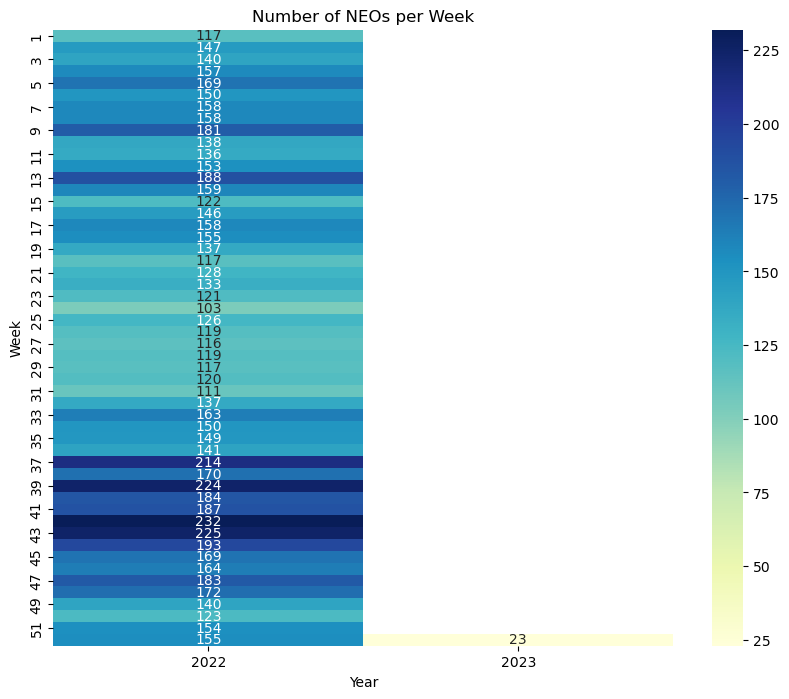

In [33]:
# We then decided to make a heatmap to visualize the data in another way

# Change the data to a suiting format
neo_counts = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        neo_counts.append({'Date': date, 'NEO Count': len(objects)})

df = pd.DataFrame(neo_counts)

# Convert "Date" to dateformat
df['Date'] = pd.to_datetime(df['Date'])

# Extract weeknumber and year 
df['Week'] = df['Date'].dt.isocalendar().week
df['Year'] = df['Date'].dt.year

# Group by weeks and year, and calculate the number of NEOs
weekly_neo_counts = df.groupby(['Year', 'Week'])['NEO Count'].sum().reset_index()

# Change the data to a pivottabelformat
pivot_table = weekly_neo_counts.pivot(index='Week', columns='Year', values='NEO Count')

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt='g', cbar=True)
plt.title('Number of NEOs per Week')
plt.xlabel('Year')
plt.ylabel('Week')
plt.show()

### Task 4: Data Visualization Part B

- Create a pie chart of the proportion of hazardous vs non-hazardous NEOs.
- Create a scatter plot of the correlation between NEO size and close approach distance.
- Customize the appearance of your plots (e.g., colors, labels, titles).
- Create interactive visualizations using a library like Plotly. For example, create an interactive scatter plot where you can hover over each point to see more information about the NEO. **Be creative!**

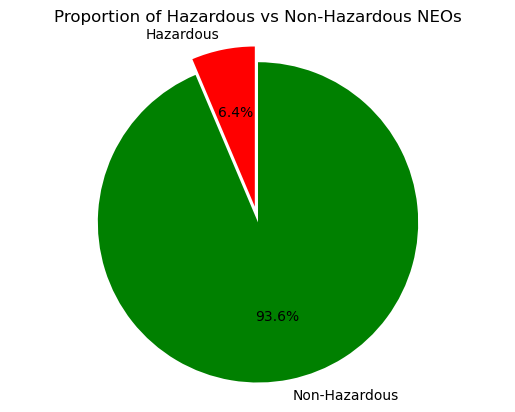

In [34]:
# Count the number of hazardous and non-hazardous NEOs.
hazardous_count = 0
non_hazardous_count = 0

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        for obj in objects:
            if obj['is_potentially_hazardous_asteroid']:
                hazardous_count += 1
            else:
                non_hazardous_count += 1

# We create a list of data for the pie chart.
labels = ['Hazardous', 'Non-Hazardous']
sizes = [hazardous_count, non_hazardous_count]
colors = ['red', 'green']
explode = (0.1, 0) 

# We create the pie chart.
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.axis('equal')  # Make sure the circle is round.

# Show the pie chart.
plt.title('Proportion of Hazardous vs Non-Hazardous NEOs')
plt.show()


We have now set up a pie chart based on hazardous vs non-hazardous NEO's. The chart shows that there are 6.4% hazardous NEO's, and 93.6% non-hazardous NEO's. Which indicate that only a small portion of the NEOs is actually hazardous

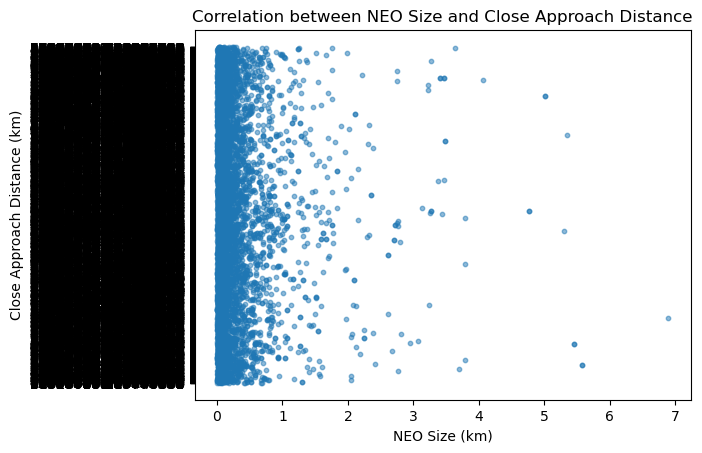

In [35]:
# We gonna set up a scatter plot.

sizes = []
distances = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            distance = obj['close_approach_data'][0]['miss_distance']['kilometers']
            sizes.append(size)
            distances.append(distance)

# We create the scatter plot.
plt.scatter(sizes, distances, s=10, alpha=0.5)

# We add labels and title.
plt.xlabel('NEO Size (km)')
plt.ylabel('Close Approach Distance (km)')
plt.title('Correlation between NEO Size and Close Approach Distance')

# Show the scatter plot.
plt.show()

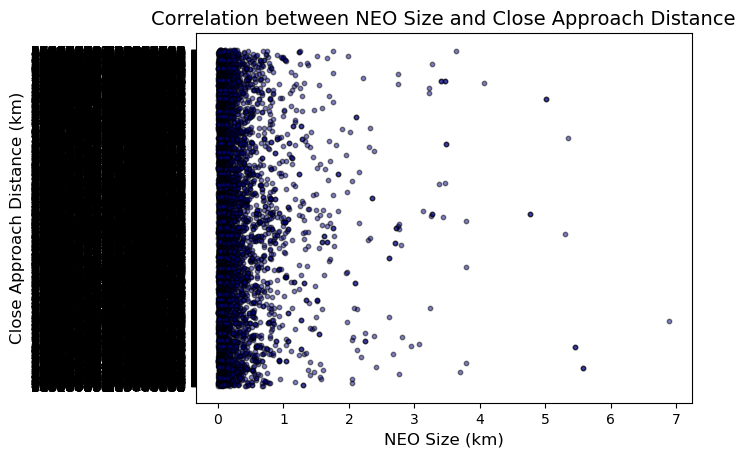

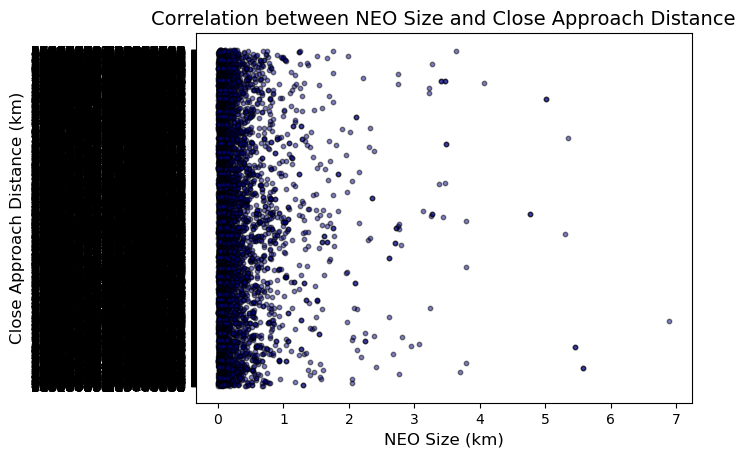

In [36]:
# We are now gonna change our layout in the scatterplot.

sizes = []
distances = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            distance = obj['close_approach_data'][0]['miss_distance']['kilometers']
            sizes.append(size)
            distances.append(distance)

# We want to change the colors in the scatter plot.
plt.scatter(sizes, distances, s=10, alpha=0.5, color='#00008b', edgecolors='black')

# We want to change the font size for the various elements.
plt.xlabel('NEO Size (km)', fontsize=12)
plt.ylabel('Close Approach Distance (km)', fontsize=12)
plt.title('Correlation between NEO Size and Close Approach Distance', fontsize=14)

# We adjust the size of ticks and labels on both axes.
plt.tick_params(axis='both', which='major', labelsize=10)

# Show the scatter plot.
plt.show()
# We are now gonna change our layout in the scatterplot.
import matplotlib.pyplot as plt

sizes = []
distances = []

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        for obj in objects:
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            distance = obj['close_approach_data'][0]['miss_distance']['kilometers']
            sizes.append(size)
            distances.append(distance)

# We want to change the colors in the scatter plot.
plt.scatter(sizes, distances, s=10, alpha=0.5, color='#00008b', edgecolors='black')

# We want to change the font size for the various elements.
plt.xlabel('NEO Size (km)', fontsize=12)
plt.ylabel('Close Approach Distance (km)', fontsize=12)
plt.title('Correlation between NEO Size and Close Approach Distance', fontsize=14)

# We adjust the size of ticks and labels on both axes.
plt.tick_params(axis='both', which='major', labelsize=10)

# Show the scatter plot.
plt.show()


The diagram shows the same as the one above, but we have now changed the layout in terms of colors, font size and other elements.

In [37]:
# We insert the code to deactivate "future warnings" as this will not affect our code and we want to remove it.
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [38]:
import plotly.express as px

# We transform data into a pandas DataFrame.
df = pd.DataFrame(columns=['NEO Name', 'Size (km)', 'Distance (km)'])

for d in data:
    near_earth_objects = d['near_earth_objects']
    for date, objects in near_earth_objects.items():
        for obj in objects:
            name = obj['name']
            size = obj['estimated_diameter']['kilometers']['estimated_diameter_max']
            distance = obj['close_approach_data'][0]['miss_distance']['kilometers']
            df = df.append({'NEO Name': name, 'Size (km)': size, 'Distance (km)': distance}, ignore_index=True)
                       

# We create an interactive scatter plot with hover information.
fig = px.scatter(df, x='Size (km)', y='Distance (km)', hover_data=['NEO Name'])
fig.update_traces(marker=dict(size=8, opacity=0.6))

# We adjust labels and titles.
fig.update_layout(
    xaxis_title='NEO Size (km)',
    yaxis_title='Close Approach Distance (km)',
    title='Correlation between NEO Size and Close Approach Distance'
)

# Show the interactive scatter plot.
fig.show()


We have now set up an interactive scatter plot that shows correlation between neo size and approach distance.

In this task we looked at the proportions between hazardous and non-hazardous NEO's, and developed a pie chart to show it. There is a significant difference between the amount of hazardous and non-hazardous NEO's, which are 6.4% and 93.6%. Based on the size of the NEOs and the distance between them, we have set up a scatter plot. From the scatter plots, we can see that the majority lie between 0-1 in size, and that the largest NEO is approx. 7.

### Task 5: Interpretation of Results

- Interpret the results of your data visualization in part A and B. 
- What insights can you gain about NEOs from your results? Summarizing your findings.
- Use your findings to make predictions or recommendations. For example, if you found that larger NEOs are more likely to be potentially hazardous, you could recommend that more resources be allocated to tracking large NEOs. **Be creative!**
- Identify, understand, and explain one scientific paper, on a clustering or classification method of relevance that could help Task 5. You don't have to implement it, you just need to justify in this notebook why the method in the scientific paper could contribute in analysis or interpretation of the results.

If we take a look at part A and part B we can see that from the results from part A indicate that the weeks where we have the least amount of NEOs is also the weeks where the average size NEO is the largest. This interferes with the fact that if the sample size is small the more effect every single test have on the final resultat. We can also see that the average size of the NEOs pr. week lays around 0,2 km, with the exception of some outliers and of course the period we mentioned earliere.

If we take a look at part B we can see that even though only a small portion of the NEOs is hazardous a large amount of the NEOs is 0-1 km in distance. But we can see from our scatterplot that there is no trend that the larger NEOs is hazardous and the small ones arent. So if we take that knowledge and compare it with part A, we can see that most dangerous period is the one where the most NEOs is observed (week 28-32). This is because if there is no correlation between size, time and if it hazardous, then the most dangerous period most be when there is most observed NEOs. If there is more NEOs then there most be more hazardouds NEOs appering. If there where a correlation then it would be when the average size of the NEOs is largest, but that is not the case.

If we summarize our findings we can conclude that the largest NEOs are more likely to be hazardous, and the large NEOs is often found in the weeks where we have the least amount of NEOs.

We have selected the scientific article "Statistical clustering analysis of NEOs to find correlations with spectral classes".
URL: https://meetingorganizer.copernicus.org/EPSC2022/EPSC2022-698.html

The implementation of the G-method, as presented in the article "Statistical clustering analysis of NEOs to find correlations with spectral classes," holds great promise in strengthening our analytical endeavors and offering comprehensive elucidation of our findings. By employing this statistical clustering technique, we can effectively identify distinct orbital parameter clusters among near-Earth objects (NEOs) and establish potential associations with their spectral classifications. This methodological approach enhances our understanding by revealing patterns and relationships within the NEO population, shedding light on their compositional diversity and orbital characteristics. The insights gleaned from this study contribute to a more nuanced interpretation of the collected data, ultimately advancing our knowledge of NEOs and their potential hazards.

### Task 6: Presentation and Documentation

- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This should include an overview of your work, the results of your data analysis, and the insights you gained from your results.